# IMPORTS

In [1]:
import cv2
import numpy as np
import matplotlib.pyplot as plt
import math
import glob
import re
from matplotlib.patches import ConnectionPatch
from pprint import pprint

In [2]:
cv2.__version__

'3.4.2'

In [3]:
project_root = '/home/davidboja/PycharmProjects/FER/hpatches-benchmark/python/ISPA'

# LOAD IMAGES

In [4]:
images = glob.glob(project_root + '/hpatches-sequences-release/v_london/*.ppm')
transformations = glob.glob(project_root + '/hpatches-sequences-release/v_london/H*')

In [5]:
images = sorted(images)
transformations = sorted(transformations)

In [6]:
image_names = [im.split('/')[-1] for im in images]

In [7]:
images

['/home/davidboja/PycharmProjects/FER/hpatches-benchmark/python/ISPA/hpatches-sequences-release/v_london/1.ppm',
 '/home/davidboja/PycharmProjects/FER/hpatches-benchmark/python/ISPA/hpatches-sequences-release/v_london/2.ppm',
 '/home/davidboja/PycharmProjects/FER/hpatches-benchmark/python/ISPA/hpatches-sequences-release/v_london/3.ppm',
 '/home/davidboja/PycharmProjects/FER/hpatches-benchmark/python/ISPA/hpatches-sequences-release/v_london/4.ppm',
 '/home/davidboja/PycharmProjects/FER/hpatches-benchmark/python/ISPA/hpatches-sequences-release/v_london/5.ppm',
 '/home/davidboja/PycharmProjects/FER/hpatches-benchmark/python/ISPA/hpatches-sequences-release/v_london/6.ppm']

In [8]:
transformations

['/home/davidboja/PycharmProjects/FER/hpatches-benchmark/python/ISPA/hpatches-sequences-release/v_london/H_1_2',
 '/home/davidboja/PycharmProjects/FER/hpatches-benchmark/python/ISPA/hpatches-sequences-release/v_london/H_1_3',
 '/home/davidboja/PycharmProjects/FER/hpatches-benchmark/python/ISPA/hpatches-sequences-release/v_london/H_1_4',
 '/home/davidboja/PycharmProjects/FER/hpatches-benchmark/python/ISPA/hpatches-sequences-release/v_london/H_1_5',
 '/home/davidboja/PycharmProjects/FER/hpatches-benchmark/python/ISPA/hpatches-sequences-release/v_london/H_1_6']

In [9]:
image_names

['1.ppm', '2.ppm', '3.ppm', '4.ppm', '5.ppm', '6.ppm']

In [10]:
images = [cv2.imread(im) for im in images]

# FIND SIFT KEYPOINTS ON IMAGES

In [11]:
images[0].shape

(914, 1380, 3)

### VIEW IMAGES

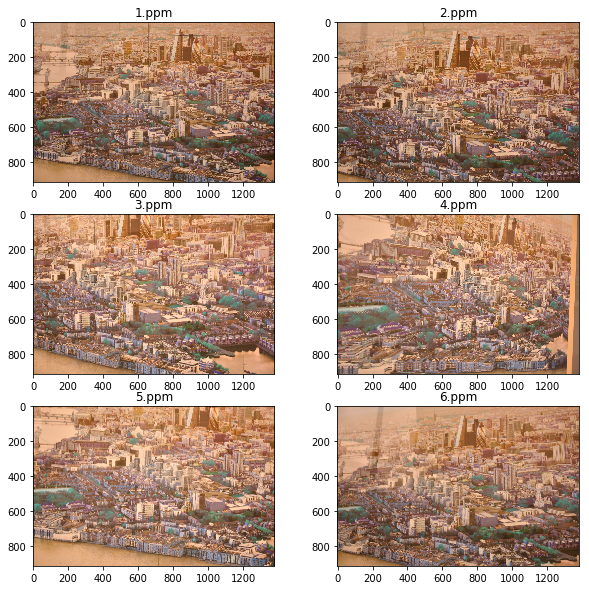

In [12]:
fig, ax = plt.subplots(nrows=3, ncols=2, figsize=(10,10))
for i, axx in enumerate(ax.ravel()):
    axx.imshow(images[i])
    axx.set_title('{}'.format(image_names[i]))
plt.show()

### FIND SIFT KEYPOINTS

In [12]:
keypoint_dict = {}

for id1,img in enumerate(images):
    keypoint_dict[image_names[id1]] = {}
    gray = cv2.cvtColor(img ,cv2.COLOR_RGB2GRAY)
    
    sift = cv2.xfeatures2d.SIFT_create()
    kp, des = sift.detectAndCompute(gray,None)
    keypoint_dict[image_names[id1]]['kp'] = kp
    keypoint_dict[image_names[id1]]['des'] = des

In [13]:
keypoint_dict['1.ppm']['des'].shape

(19291, 128)

In [14]:
keypoint_dict.keys()

dict_keys(['1.ppm', '2.ppm', '3.ppm', '4.ppm', '5.ppm', '6.ppm'])

### VISUALIZE KEYPOINTS

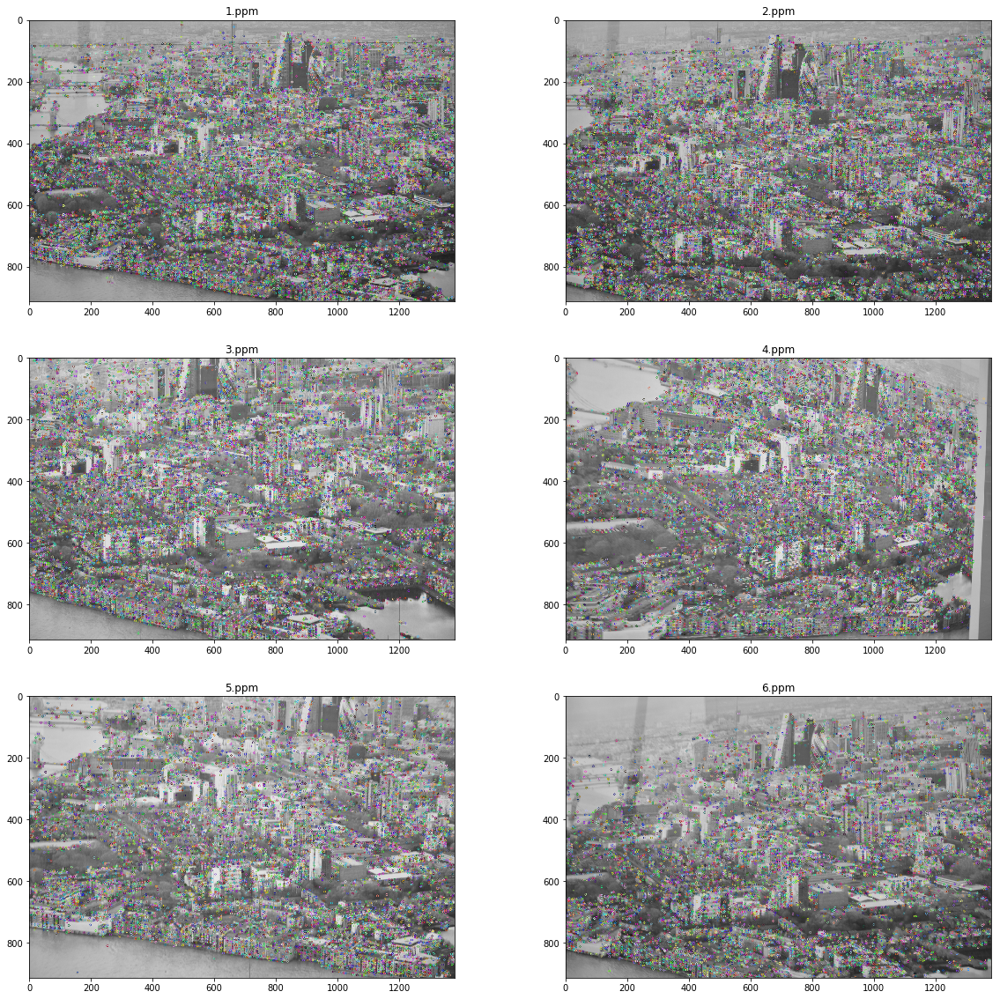

In [16]:
fig, ax = plt.subplots(nrows=3, ncols=2, figsize=(20,20))
for id1, axx in enumerate(ax.ravel()):
    
    gray = cv2.cvtColor(images[id1] ,cv2.COLOR_RGB2GRAY)
    gray_with_kp = cv2.drawKeypoints(gray, 
                                     keypoint_dict[image_names[id1]]['kp'], 
                                     cv2.DRAW_MATCHES_FLAGS_DEFAULT)
    
    axx.imshow(gray_with_kp)
    axx.set_title('{}'.format(image_names[id1]))
plt.show()

# REMOVING POINTS THAT ARE NOT COMMON BETWEEN IMAGES

### GET TRANSFORMATION MATRICES

In [15]:
transformations_matrices = []

for transf in transformations:
    with open(transf) as file:
        s = file.read()
        nrs = re.split('\n| ',s)[:-1]
        transformations_matrices.append(np.array(nrs).reshape(3,3).astype(np.float))

In [16]:
transformations_matrices

[array([[ 8.8632e-01, -1.2492e-02, -1.3692e+02],
        [-4.7209e-02,  1.0157e+00,  4.2178e+01],
        [-1.4230e-04,  1.8595e-05,  1.0005e+00]]),
 array([[ 8.6273e-01,  3.0727e-02, -2.5765e+02],
        [-8.1274e-02,  1.0175e+00, -4.8986e+01],
        [-1.6043e-04,  4.4449e-05,  1.0008e+00]]),
 array([[ 2.4144e+00, -2.2023e-03, -1.9930e+02],
        [ 5.2146e-01,  2.0547e+00, -5.6949e+02],
        [ 1.0423e-03,  8.4489e-05,  1.0043e+00]]),
 array([[ 1.3838e+00,  2.4181e-02, -9.3882e+01],
        [ 9.3344e-02,  1.3070e+00, -2.3276e+02],
        [ 1.5995e-04,  6.7546e-05,  1.0008e+00]]),
 array([[ 7.7105e-01, -9.7833e-02, -3.6994e+00],
        [-9.2675e-02,  8.1167e-01,  9.2799e+01],
        [-1.3920e-04, -1.2806e-04,  9.9964e-01]])]

### REMOVE POINTS FORM REF. IMAGE THAT DO NOT APPEAR  ON SEQUENCE IMAGES

In [17]:
len(keypoint_dict['1.ppm']['kp'])

19291

In [18]:
images_size = images[0].shape

In [19]:
images_size

(914, 1380, 3)

In [20]:
# for id1, orig_point in (keypoint_dict['1.ppm']['kp']):
#     point = np.array(keypoint_dict['1.ppm']['kp'][i].pt + (1,)).reshape(3,1)
#     imaged_point = [ np.dot(tr, point) for tr in transformations_matrices ]
#     imaged_point_normal = [ dot/dot[2,0] for dot in imaged_point]
#     [ False for im_point in imaged_point ]

In [21]:
for id1, im in enumerate(images[1:]):
    print('Processing image {}'.format(image_names[id1+1]))
    indexes_to_remove = []
    
    for i in range(len(keypoint_dict['1.ppm']['kp'])):
        point = np.array(keypoint_dict['1.ppm']['kp'][i].pt + (1,)).reshape(3,1)
        imaged_point = np.dot(transformations_matrices[id1], point)
        imaged_point_normal = imaged_point/imaged_point[2,0]
        
        if not ((0 < imaged_point_normal[0,0] and imaged_point_normal[0,0] < images_size[1]) and 
                (0 < imaged_point_normal[1,0] and imaged_point_normal[1,0] < images_size[0])):
            indexes_to_remove.append(i)
    
    print('Removed {} keypoints from the ref images\
           in regards to img {}'.format(len(indexes_to_remove),image_names[id1+1]))
    keypoint_dict['1.ppm']['kp'] = [kp for id1, kp in enumerate(keypoint_dict['1.ppm']['kp']) 
                                    if id1 not in indexes_to_remove]
    keypoint_dict['1.ppm']['des'] = np.delete(keypoint_dict['1.ppm']['des'], indexes_to_remove, 0)

Processing image 2.ppm
Removed 3166 keypoints from the ref images           in regards to img 2.ppm
Processing image 3.ppm
Removed 2008 keypoints from the ref images           in regards to img 3.ppm
Processing image 4.ppm
Removed 282 keypoints from the ref images           in regards to img 4.ppm
Processing image 5.ppm
Removed 814 keypoints from the ref images           in regards to img 5.ppm
Processing image 6.ppm
Removed 0 keypoints from the ref images           in regards to img 6.ppm


In [22]:
len(keypoint_dict['1.ppm']['kp'])

13021

### REMOVE POINTS FROM SEQUENCE  IMAGES THAT DO NOT APPEAR IN  REF. IMAGE

In [23]:
for name in image_names[1:]:
    print('Keypoints in {}: {}'.format(name,len(keypoint_dict[name]['kp'])))

Keypoints in 2.ppm: 19865
Keypoints in 3.ppm: 17279
Keypoints in 4.ppm: 16152
Keypoints in 5.ppm: 12326
Keypoints in 6.ppm: 10346


In [24]:
for id1, name in enumerate(image_names[1:]):
    print('Processing image {}'.format(name))
    indexes_to_remove = []
    
    for id2, point in enumerate(keypoint_dict[name]['kp']):
        point = np.array(point.pt + (1,)).reshape(3,1)
        
        imaged_point = np.dot(np.linalg.inv(transformations_matrices[id1]), point)
        imaged_point_normal = imaged_point/imaged_point[2,0]
        
        if not ((0 < imaged_point_normal[0,0] and imaged_point_normal[0,0] < images_size[1]) and 
                (0 < imaged_point_normal[1,0] and imaged_point_normal[1,0] < images_size[0])):
            indexes_to_remove.append(id2)
    
    print('Removed {} keypoints from the image {}'.format(len(indexes_to_remove),name))
    keypoint_dict[name]['kp'] = [kp for id1, kp in enumerate(keypoint_dict[name]['kp']) 
                                    if id1 not in indexes_to_remove]
    keypoint_dict[name]['des'] =  np.delete(keypoint_dict[name]['des'], indexes_to_remove, 0)

Processing image 2.ppm
Removed 724 keypoints from the image 2.ppm
Processing image 3.ppm
Removed 1992 keypoints from the image 3.ppm
Processing image 4.ppm
Removed 876 keypoints from the image 4.ppm
Processing image 5.ppm
Removed 380 keypoints from the image 5.ppm
Processing image 6.ppm
Removed 177 keypoints from the image 6.ppm


In [25]:
for name in image_names[1:]:
    print('Keypoints in {}: {}'.format(name,len(keypoint_dict[name]['kp'])))

Keypoints in 2.ppm: 19141
Keypoints in 3.ppm: 15287
Keypoints in 4.ppm: 15276
Keypoints in 5.ppm: 11946
Keypoints in 6.ppm: 10169


### VISUALIZE IMAGES

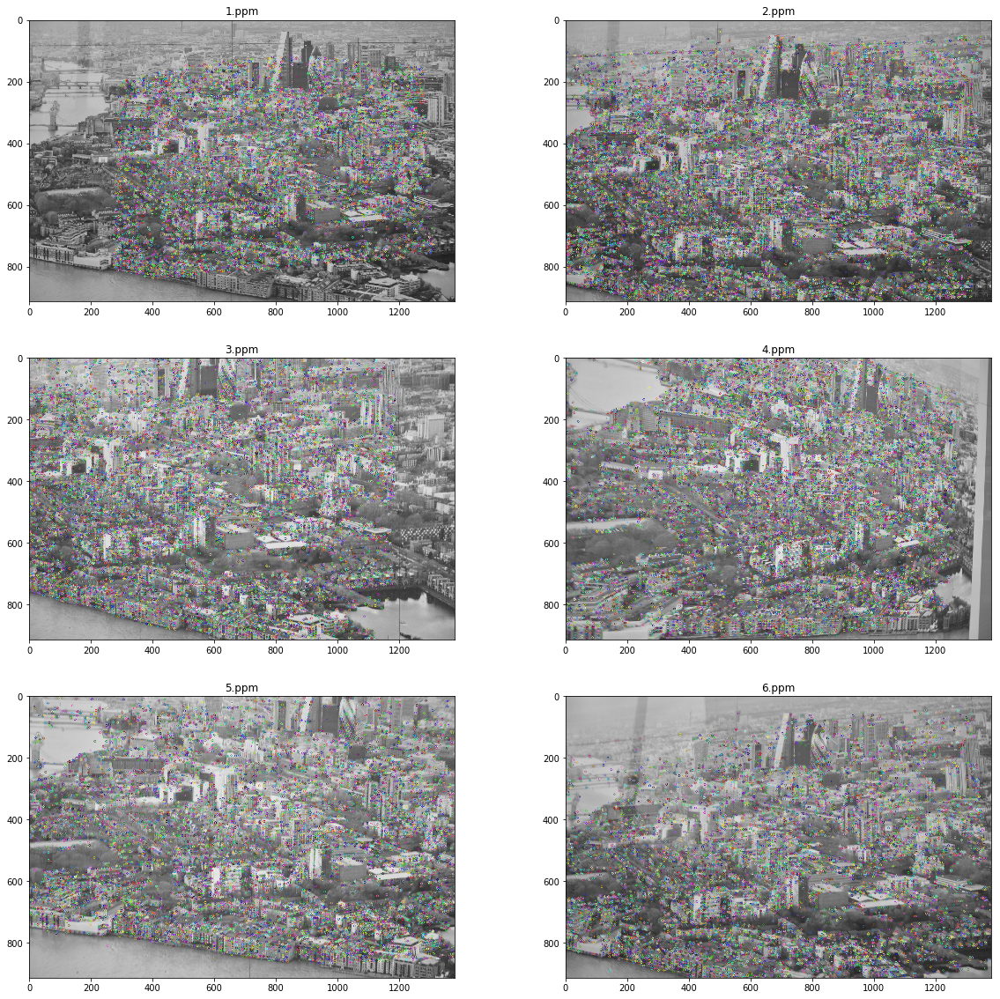

In [26]:
fig, ax = plt.subplots(nrows=3, ncols=2, figsize=(20,20))
for id1, axx in enumerate(ax.ravel()):
    
    gray = cv2.cvtColor(images[id1] ,cv2.COLOR_RGB2GRAY)
    gray_with_kp = cv2.drawKeypoints(gray, 
                                     keypoint_dict[image_names[id1]]['kp'], 
                                     cv2.DRAW_MATCHES_FLAGS_DEFAULT)
    
    axx.imshow(gray_with_kp)
    axx.set_title('{}'.format(image_names[id1]))
plt.show()

In [27]:
#  data=[(1, 1), (2, 3), 'r',
#        (2, 2), (4, 5), 'g',
#        (5, 5), (6, 7), 'b',]

# plt.plot(*data)

# IMAGE MATCHING

### GET MATCHES

In [28]:
image_names[1:]

['2.ppm', '3.ppm', '4.ppm', '5.ppm', '6.ppm']

In [29]:
matches_with_ref = {}

In [30]:
for im in image_names[1:]:
    bf = cv2.BFMatcher(cv2.NORM_L2)#, crossCheck=True)
    matches = bf.match(keypoint_dict['1.ppm']['des'], keypoint_dict[im]['des'])
    matches_with_ref[im] = sorted(matches, key = lambda x:x.distance)

### VISUALIZE TOP TEN MATCHES

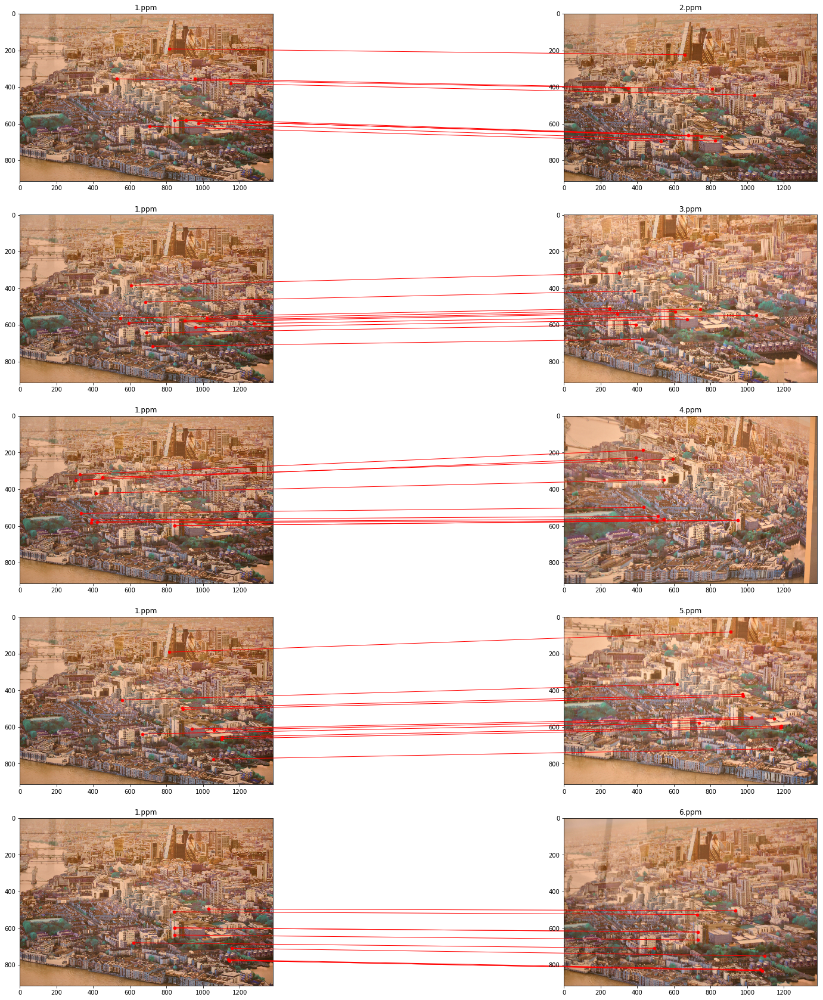

In [31]:
fig, ax = plt.subplots(nrows=5, ncols=2, figsize=(30,30))
for i, axx in enumerate(ax.ravel()):
    if (i % 2) == 1:
        continue
        
    points_on_first_img = []
    points_on_second_img = []
    
    axx.imshow(images[0])
    axx.set_title('{}'.format(image_names[0]))
    ax.ravel()[i+1].imshow(images[int(i/2)+1])
    ax.ravel()[i+1].set_title('{}'.format(image_names[int(i/2)+1]))
    
    for m in matches_with_ref[image_names[int(i/2)+1]][:10]:
        points_on_first_img.append(keypoint_dict['1.ppm']['kp'][m.queryIdx].pt)
        points_on_second_img.append(keypoint_dict[image_names[int(i/2)+1]]['kp'][m.trainIdx].pt)
        
    axx.scatter([i[0] for i in points_on_first_img],
                [i[1] for i in points_on_first_img],
                s=20, 
                c='red')
    
    ax.ravel()[i+1].scatter([i[0] for i in points_on_second_img],
                            [i[1] for i in points_on_second_img],
                            s=20, 
                            c='red')
    
    for j in range(len(points_on_first_img)):
        con = ConnectionPatch(xyA=(points_on_second_img[j][0],points_on_second_img[j][1]), 
                              xyB=(points_on_first_img[j][0],points_on_first_img[j][1]),
                              coordsA="data", coordsB="data",
                              axesA=ax.ravel()[i+1], axesB=axx, color="red")
        
        ax.ravel()[i+1].add_artist(con)
    

plt.show()

# EVALUATION

### TASK 1: PATCH VERIFICATION

In [33]:
n = 10

In [32]:
from random import sample

In [34]:
kp_on_ref = sample(keypoint_dict['1.ppm']['kp'], n)

In [35]:
kp_other = [ for name in image_names[1:]]

[<KeyPoint 0x7f0dcb0c4cc0>,
 <KeyPoint 0x7f0dcb07f7b0>,
 <KeyPoint 0x7f0dcb0f38a0>,
 <KeyPoint 0x7f0dcb0bd5d0>,
 <KeyPoint 0x7f0dcb0c8690>]

In [37]:
a = kp_on_ref[0]

In [ ]:
kp_on_ref = keypoint_dict['1.ppm']['kp'].index()
kp_other = []

In [ ]:
for kp_on_ref

## AAA

In [42]:
matches_with_ref.keys()

dict_keys(['2.ppm', '3.ppm', '4.ppm', '5.ppm', '6.ppm'])

In [43]:
match_errors = {}

In [ ]:
for name,matches in matches_with_ref.items():
    for m in matches:
        m.queryIdx

In [50]:
dict(zip(image_names[1:],imaged_point_normalized))

{'2.ppm': array([[ 96.49894605],
        [825.93203117],
        [  1.        ]]), '3.ppm': array([[1.10820167e-01],
        [7.13395010e+02],
        [1.00000000e+00]]), '4.ppm': array([[336.26163203],
        [845.86859604],
        [  1.        ]]), '5.ppm': array([[274.07728453],
        [722.87629457],
        [  1.        ]]), '6.ppm': array([[151.45510638],
        [796.86095962],
        [  1.        ]])}

In [75]:
imaged_point_normalized['2.ppm'][:2,:].shape

(2, 1)

In [73]:
np.array((2,1)).reshape(2,1).shape

(2, 1)

In [81]:
np.linalg.norm(np.array(keypoint_dict[name]['kp'][20].pt).reshape(2,1), imaged_point_normalized['2.ppm'][:2,:])

/home/davidboja/.local/lib/python3.6/site-packages/numpy/linalg/linalg.py:2340: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  (ord in ('f', 'fro') and ndim == 2) or


ValueError: The truth value of an array with more than one element is ambiguous. Use a.any() or a.all()

In [84]:
match_errors = {}
for name in image_names[1:]:
    match_errors[name] = {}

for id1, point in enumerate(keypoint_dict['1.ppm']['kp']):
    point = np.array(point.pt + (1,)).reshape(3,1)
    imaged_point = [ np.dot(tr, point) for tr in transformations_matrices]
    imaged_point_normalized = [ dot/dot[2,0] for dot in imaged_point]
    imaged_point_normalized = dict(zip(image_names[1:], imaged_point_normalized))
    
    match_errors[name] = {}
    
    for name in image_names[1:]:
        match_errors[name] = {}
        match_errors[name][id1] = None
        for m in matches_with_ref[name]:
            if m.queryIdx == id1 :
                match_errors[name][id1] = np.linalg.norm(np.array(keypoint_dict[name]['kp'][m.trainIdx].pt).reshape(2,1) -
                                                        imaged_point_normalized[name][:2,:])
                break
    
        if not match_errors[name][id1]:
            print('THERE ARE NO MATCHES FOR KEYPOINT {} IN IMAGE {}'.format(id1,name))
            match_errors[name][id1] = -1

In [85]:
match_errors

{'2.ppm': {13020: 0.762491354973777},
 '3.ppm': {13020: 77.02377497995784},
 '4.ppm': {13020: 726.4172042677012},
 '5.ppm': {13020: 142.6432665613596},
 '6.ppm': {13020: 0.3975384748628021}}

In [29]:
bf = cv2.BFMatcher(cv2.NORM_L2)#, crossCheck=True)

In [30]:
matches = bf.match(keypoint_dict['1.ppm']['des'], keypoint_dict['2.ppm']['des'])

In [34]:
matches[1].distance

302.1953125

In [35]:
matches = sorted(matches, key = lambda x:x.distance)

In [49]:
matches[1].distance

22.956480026245117

In [77]:
matches[1].

<DMatch 0x7f071f32a290>

In [72]:
a = matches[0]

In [78]:
a.queryIdx

14186

In [79]:
a.trainIdx

11816

In [71]:
img3 = cv2.drawMatches(images[0],
                       keypoint_dict['1.ppm']['kp'],
                       images[1],
                       keypoint_dict['2.ppm']['kp'],
                       matches, 
                       None)

error: OpenCV(3.4.2) /tmp/build/80754af9/opencv-suite_1535558553474/work/modules/features2d/src/draw.cpp:211: error: (-215:Assertion failed) i1 >= 0 && i1 < static_cast<int>(keypoints1.size()) in function 'drawMatches'


In [42]:
img3 = cv2.drawMatches(images[0],keypoint_dict['1.ppm']['kp'],images[1],keypoint_dict['2.ppm']['kp'], matches[:10],)

error: OpenCV(3.4.2) /tmp/build/80754af9/opencv-suite_1535558553474/work/modules/features2d/src/draw.cpp:211: error: (-215:Assertion failed) i1 >= 0 && i1 < static_cast<int>(keypoints1.size()) in function 'drawMatches'


In [ ]:
for id1, name in image_names[1:]:

    bf = cv2.BFMatcher(cv2.NORM_L2)#, crossCheck=True)

    matches = bf.match(keypoint_dict['1.ppm']['des'], keypoint_dict[name]['des'])